# ws 01 Detect

In [31]:
!pip install mtcnn
!pip install Pillow


[notice] A new release of pip is available: 24.1.2 -> 24.3.1
[notice] To update, run: C:\Users\ASUS\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 24.1.2 -> 24.3.1
[notice] To update, run: C:\Users\ASUS\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [32]:
import numpy as np
from mtcnn.mtcnn import MTCNN
from PIL import Image, ImageDraw


In [33]:
'''from google.colab import drive
drive.mount('/content/drive/')

!ls '/content/drive/MyDrive/Colab Notebooks'''

"from google.colab import drive\ndrive.mount('/content/drive/')\n\n!ls '/content/drive/MyDrive/Colab Notebooks"

img size: (4608, 3456)
img size: (1843, 1382)


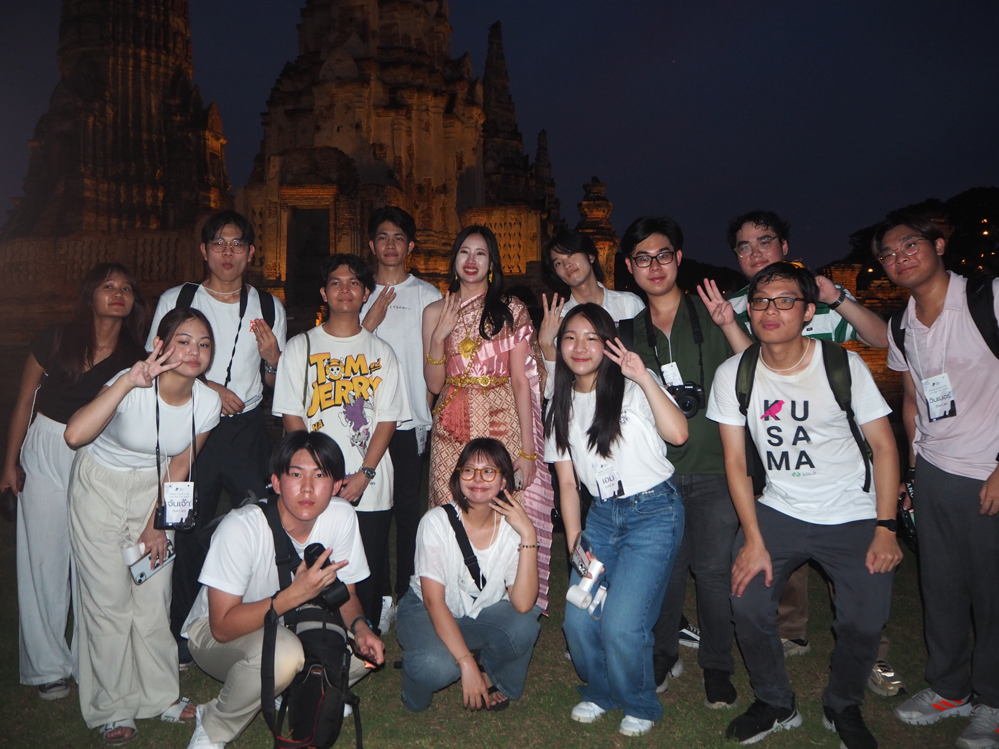

In [34]:
#path = '/content/drive/MyDrive/Colab Notebooks/datasets/face/'
#filename = path + 'IMG_20.jpg'
filename = 'IMG_20.jpg'

im = Image.open(filename) # .convert("RGB")
print('img size:', im.size)

imgW, imgH = (400, 220)

scale = 0.4
im = im.resize((round(im.size[0]*scale), round(im.size[1]*scale)))

print('img size:', im.size)
im

In [35]:
detector = MTCNN()

im_arr = np.array(im)

faces = detector.detect_faces(im_arr)  
print(f'Found {len(faces)} face(s)')
faces

Found 14 face(s)


[{'box': [602, 493, 66, 83],
  'confidence': 0.9999738931655884,
  'keypoints': {'nose': [637, 535],
   'mouth_right': [651, 553],
   'right_eye': [651, 523],
   'left_eye': [620, 523],
   'mouth_left': [623, 554]}},
 {'box': [1165, 436, 84, 104],
  'confidence': 0.9998910427093506,
  'keypoints': {'nose': [1210, 495],
   'mouth_right': [1227, 509],
   'right_eye': [1224, 471],
   'left_eye': [1188, 477],
   'mouth_left': [1197, 515]}},
 {'box': [688, 410, 62, 81],
  'confidence': 0.9998506307601929,
  'keypoints': {'nose': [721, 454],
   'mouth_right': [733, 471],
   'right_eye': [735, 441],
   'left_eye': [706, 440],
   'mouth_left': [708, 470]}},
 {'box': [845, 833, 76, 93],
  'confidence': 0.9998140931129456,
  'keypoints': {'nose': [881, 887],
   'mouth_right': [900, 900],
   'right_eye': [900, 869],
   'left_eye': [864, 868],
   'mouth_left': [864, 899]}},
 {'box': [1625, 417, 95, 106],
  'confidence': 0.9997660517692566,
  'keypoints': {'nose': [1661, 477],
   'mouth_right': [16

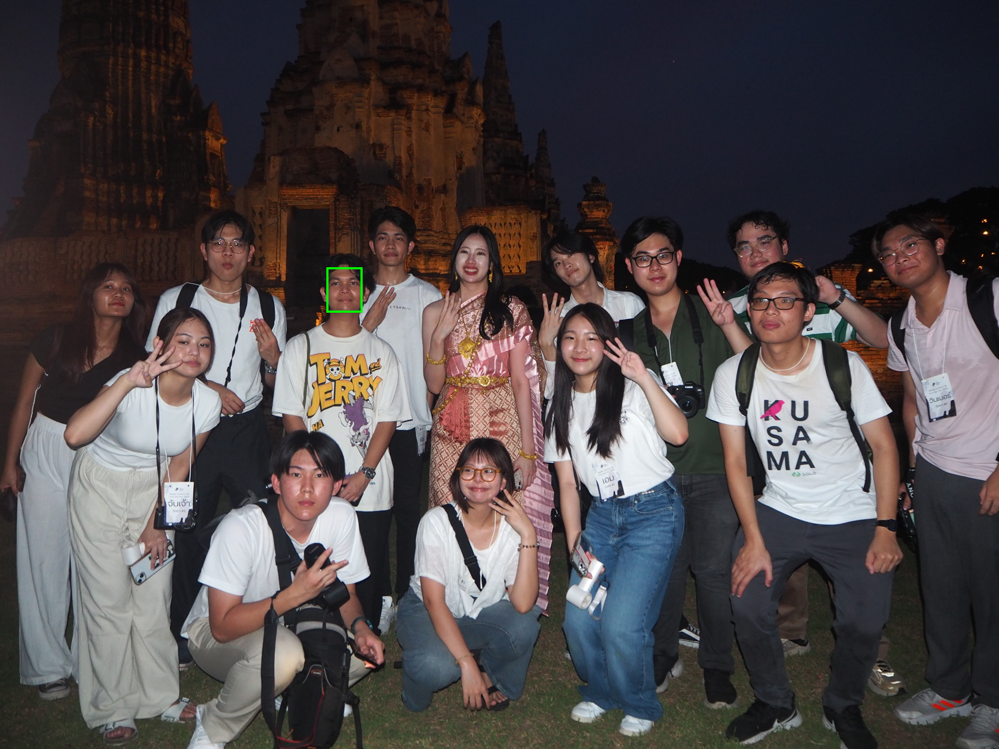

In [36]:
x1, y1, width, height = faces[0]['box']
x2, y2 = x1 + width, y1 + height

draw = ImageDraw.Draw(im)
draw.rectangle([(x1,y1), (x2,y2)], outline=(0,255,0), width=4)
im

In [37]:
im.save('face_1.jpg')

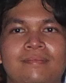

In [38]:
face = im_arr[y1:y2, x1:x2]
im_face = Image.fromarray(face)
im_face

In [39]:
im_face.save('face1.jpg')

In [47]:
faces[0]['box']
faces[0]['keypoints']['left_eye']

'''kp1 = faces[0]['keypoints']['left_eye']
kp2 = faces[0]['keypoints']['right_eye']  
kp3 = faces[0]['keypoints']['nose']  
kp4 = faces[0]['keypoints']['mouth_left'] 
kp5 = faces[0]['keypoints']['mouth_right']'''

kp1 = tuple(faces[0]['keypoints']['left_eye'])       
kp2 = tuple(faces[0]['keypoints']['right_eye'])
kp3 = tuple(faces[0]['keypoints']['nose'])
kp4 = tuple(faces[0]['keypoints']['mouth_left'])
kp5 = tuple(faces[0]['keypoints']['mouth_right'])   

draw.line((kp1, kp2, kp3, kp4, kp5), fill=(0, 255, 0), width=4) 